In [2]:
import cv2 as cv
import numpy as np

import heapq

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib

import torch

import scenedetect

b = plt.get_backend() #hacky fix for matplotlib
model_yolo = torch.hub.load('ultralytics/yolov3', 'yolov3')  # or yolov3-spp, yolov3-tiny, custom
matplotlib.use(b)

/home/errorgorn/.local/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Using cache found in /home/errorgorn/.cache/torch/hub/ultralytics_yolov3_master
YOLOv3 🚀 2022-11-12 torch 1.13.0+cu117 CPU

Fusing layers... 
Model Summary: 261 layers, 61922845 parameters, 0 gradients
Adding AutoShape... 


In [3]:
def plot_diff(name):
    cap=cv.VideoCapture(name)
    
    pp=None
    cnt=np.zeros(1000)

    while (cap.isOpened()):
        ret,frame=cap.read()
        if (ret):
            curr=frame.astype(np.int32)
            if (not pp is None):
                (a,b)=np.unique(abs(pp-curr).sum(axis=2),return_counts=True)
                cnt[a]+=b
            pp=curr
        else:
            break
            
    plt.plot(cnt)
    plt.yscale('log')

In [4]:
def plot_diff2(name):
    cap=cv.VideoCapture(name)
    
    pp=None
    cnt=np.zeros(2000)

    while (cap.isOpened()):
        ret,frame=cap.read()
        if (ret):
            curr=frame.astype(np.int32)
            if (not pp is None):
                cnt[(abs(pp-curr).sum())//100000]+=1
            pp=curr
        else:
            break
            
    plt.plot(cnt)
    plt.yscale('log')

In [5]:
def get_top_diff(name): 
    pp=None
    h=[]
    num=0
    
    cap=cv.VideoCapture(name)
    length=int(cap.get(cv.CAP_PROP_FRAME_COUNT))
    while (cap.isOpened()):
        ret,frame=cap.read()
        if (ret):
            curr=frame.astype(np.int32)
            if (not pp is None):
                val=(abs(pp-curr).sum())
                heapq.heappush(h,(-val,num))
                num+=1
            pp=curr
        else:
            break
            
    s=set()
    times=[]
    for i in range(length//200):
        temp=heapq.heappop(h)[1]
        s.add(temp)
        s.add(temp+1)
        times.append(temp)
    
    times.sort()
    
    num=0
    cap=cv.VideoCapture(name)
    frames={}
    while (cap.isOpened()):
        ret,frame=cap.read()
        if (ret):
            if (num in s):
                frames[num]=frame[...,::-1]
            num+=1
        else:
            break
        
    fig,axs=plt.subplots(len(times),2,figsize=(16,len(s)*2))
    
    for i in range(len(times)):
        axs[i,0].imshow(frames[times[i]])
        axs[i,1].imshow(frames[times[i]+1])
    
    pad=5
    for ax, row in zip(axs[:,0], times):
        ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                size='large', ha='right', va='center')

In [6]:
def get_square(x1,y1,x2,y2):
    x=x2-x1
    y=y2-y1
    
    if (y>=x):
        y2-=y-x
    else:
        x1+=(x-y)//2
        x2-=(x-y)//2
        
    return (x1,y1,x2,y2)

def ratio(dim,x1,y1,x2,y2):
    return ((x2-x1)/dim[1])*((y2-y1)/dim[0])

In [7]:
def plot_scenes(name):
    cap=cv.VideoCapture(name)

    a=scenedetect.detect(name,
        scenedetect.detectors.AdaptiveDetector(
            adaptive_threshold=5.0,
            min_scene_len=int(cap.get(cv.CAP_PROP_FPS))
        ),
    )

    times=[]
    for p in a:
        times.append(p[0].get_frames())
        
    num=0
    cap=cv.VideoCapture(name)
    frames={}
    while (cap.isOpened()):
        ret,frame=cap.read()
        if (ret):
            if (num in times or num+1 in times):
                frames[num]=frame[...,::-1]
            num+=1
        else:
            break

    fig,axs=plt.subplots(len(times),2,figsize=(16,len(times)*3))

    for i in range(len(times)):
        for j in range(2):
            if (times[i]-1+j in frames):
                axs[i,j].imshow(frames[times[i]-1+j])
                for obj in model(frames[times[i]-1+j]).xyxy[0]:
                    if (obj[-1]==0):
                        (x1,y1,x2,y2)=[int(obj[i]) for i in range(4)]
                        axs[i,j].add_patch(patches.Rectangle(
                            (x1,y1),x2-x1,y2-y1,linewidth=1,edgecolor='r',facecolor='none'
                        ))
                        (x1,y1,x2,y2)=get_square(x1,y1,x2,y2)
                        axs[i,j].add_patch(patches.Rectangle(
                            (x1,y1),x2-x1,y2-y1,linewidth=1,edgecolor='b',facecolor='none'
                        ))

    pad=5
    for ax, row in zip(axs[:,0], times):
        ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
                xycoords=ax.yaxis.label, textcoords='offset points',
                size='large', ha='right', va='center')

    plt.show()

Downscale factor set to 2, effective resolution: 320 x 180


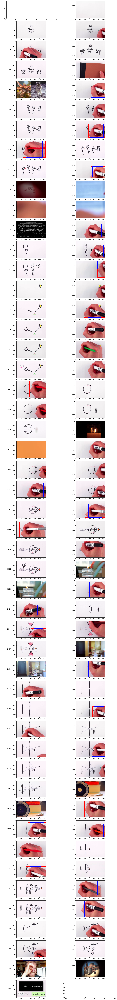

In [9]:
name="test2.mp4"

cap=cv.VideoCapture(name)

a=scenedetect.detect(name,
    scenedetect.detectors.AdaptiveDetector(
        adaptive_threshold=5.0,
        min_scene_len=int(cap.get(cv.CAP_PROP_FPS))
    ),
)

times=[]
for p in a:
    times.append(p[0].get_frames())
times.append(a[-1][1].get_frames())

num=0
cap=cv.VideoCapture(name)
frames={}
while (cap.isOpened()):
    ret,frame=cap.read()
    if (ret):
        if (num in times or num+1 in times):
            frames[num]=frame[...,::-1]
        num+=1
    else:
        break

yolo_out={}
fig,axs=plt.subplots(len(times),2,figsize=(16,len(times)*3))

for i in range(len(times)):
    for j in range(2):
        if (times[i]-1+j in frames):
            axs[i,j].imshow(frames[times[i]-1+j])
            yolo_out[times[i]-1+j]=model_yolo(frames[times[i]-1+j])
            for obj in yolo_out[times[i]-1+j].xyxy[0]:
                if (obj[-1]==0):
                    (x1,y1,x2,y2)=[int(obj[i]) for i in range(4)]
                    if (ratio(frames[times[i]-1+j].shape,x1,y1,x2,y2)<=1/4): continue
                    axs[i,j].add_patch(patches.Rectangle(
                        (x1,y1),x2-x1,y2-y1,linewidth=1,edgecolor='r',facecolor='none'
                    ))
                    (x1,y1,x2,y2)=get_square(x1,y1,x2,y2)
                    axs[i,j].add_patch(patches.Rectangle(
                        (x1,y1),x2-x1,y2-y1,linewidth=1,edgecolor='b',facecolor='none'
                    ))

pad=5
for ax, row in zip(axs[:,0], times):
    ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
            xycoords=ax.yaxis.label, textcoords='offset points',
            size='large', ha='right', va='center')

plt.show()

Downscale factor set to 2, effective resolution: 320 x 180


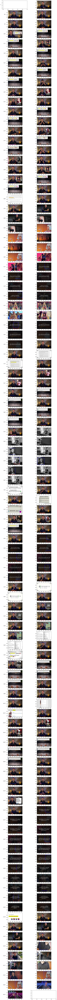

In [11]:
name="test.mp4"

cap=cv.VideoCapture(name)

a=scenedetect.detect(name,
    scenedetect.detectors.AdaptiveDetector(
        adaptive_threshold=5.0,
        min_scene_len=int(cap.get(cv.CAP_PROP_FPS))
    ),
)

times=[]
for p in a:
    times.append(p[0].get_frames())
times.append(a[-1][1].get_frames())

num=0
cap=cv.VideoCapture(name)
frames={}
while (cap.isOpened()):
    ret,frame=cap.read()
    if (ret):
        if (num in times or num+1 in times):
            frames[num]=frame[...,::-1]
        num+=1
    else:
        break

yolo_out={}
fig,axs=plt.subplots(len(times),2,figsize=(16,len(times)*3))

for i in range(len(times)):
    for j in range(2):
        if (times[i]-1+j in frames):
            axs[i,j].imshow(frames[times[i]-1+j])
            yolo_out[times[i]-1+j]=model_yolo(frames[times[i]-1+j])
            for obj in yolo_out[times[i]-1+j].xyxy[0]:
                if (obj[-1]==0):
                    (x1,y1,x2,y2)=[int(obj[i]) for i in range(4)]
                    if (ratio(frames[times[i]-1+j].shape,x1,y1,x2,y2)<=1/4): continue
                    axs[i,j].add_patch(patches.Rectangle(
                        (x1,y1),x2-x1,y2-y1,linewidth=1,edgecolor='r',facecolor='none'
                    ))
                    (x1,y1,x2,y2)=get_square(x1,y1,x2,y2)
                    axs[i,j].add_patch(patches.Rectangle(
                        (x1,y1),x2-x1,y2-y1,linewidth=1,edgecolor='b',facecolor='none'
                    ))

pad=5
for ax, row in zip(axs[:,0], times):
    ax.annotate(row, xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
            xycoords=ax.yaxis.label, textcoords='offset points',
            size='large', ha='right', va='center')

plt.show()

In [8]:
def normalize(img):
    return cv.cvtColor(cv.cvtColor(img,cv.COLOR_RGB2GRAY),cv.COLOR_GRAY2RGB) #wtf

In [9]:
faces=[]

for i in range(len(times)):
    for j in range(1):
        if (times[i]-1+j in frames):
            axs[i,j].imshow(frames[times[i]-1+j])
            for obj in yolo_out[times[i]-1+j].xyxy[0]:
                if (obj[-1]==0):
                    (x1,y1,x2,y2)=[int(obj[i]) for i in range(4)]
                    if (ratio(frames[times[i]-1+j].shape,x1,y1,x2,y2)<=1/4): continue
                    (x1,y1,x2,y2)=get_square(x1,y1,x2,y2)
                    faces.append(
                        normalize(cv.resize(frames[times[i]-1+j][y1:y2,x1:x2],(224,224),interpolation=cv.INTER_AREA))
                    )

In [10]:
from keras.applications.vgg16 import VGG16 
from keras.models import Model

In [11]:
model_vgg = VGG16()
model_vgg = Model(inputs=model_vgg.inputs, outputs=model_vgg.layers[-2].output)

In [12]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

In [13]:
faces_flat=model_vgg.predict(np.array(faces))

2/2 [==============================] - 3s 2s/step


In [14]:
faces_flat

array([[    0.38907,     0.94503,           0, ...,           0,           0,      1.9364],
       [     1.0318,           0,           0, ...,           0,           0,      2.2916],
       [    0.34247,      1.0736,           0, ...,           0,           0,      1.0927],
       ...,
       [    0.90221,           0,           0, ...,           0,           0,           0],
       [    0.25021,     0.09363,           0, ...,           0,           0,      2.1708],
       [          0,           0,     0.71009, ...,     0.89723,           0,      1.7487]], dtype=float32)

In [15]:
cluster=min(5,faces_flat.shape[0])
res=KMeans(n_clusters=cluster, random_state=42).fit(faces_flat).labels_

In [16]:
res

array([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 4, 4, 3, 3, 4, 3, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 3, 0, 1, 0, 2, 2, 0, 4], dtype=int32)

In [17]:
import random

In [18]:
np.unique(res,return_counts=True)

(array([0, 1, 2, 3, 4], dtype=int32), array([38,  9,  2,  9,  4]))

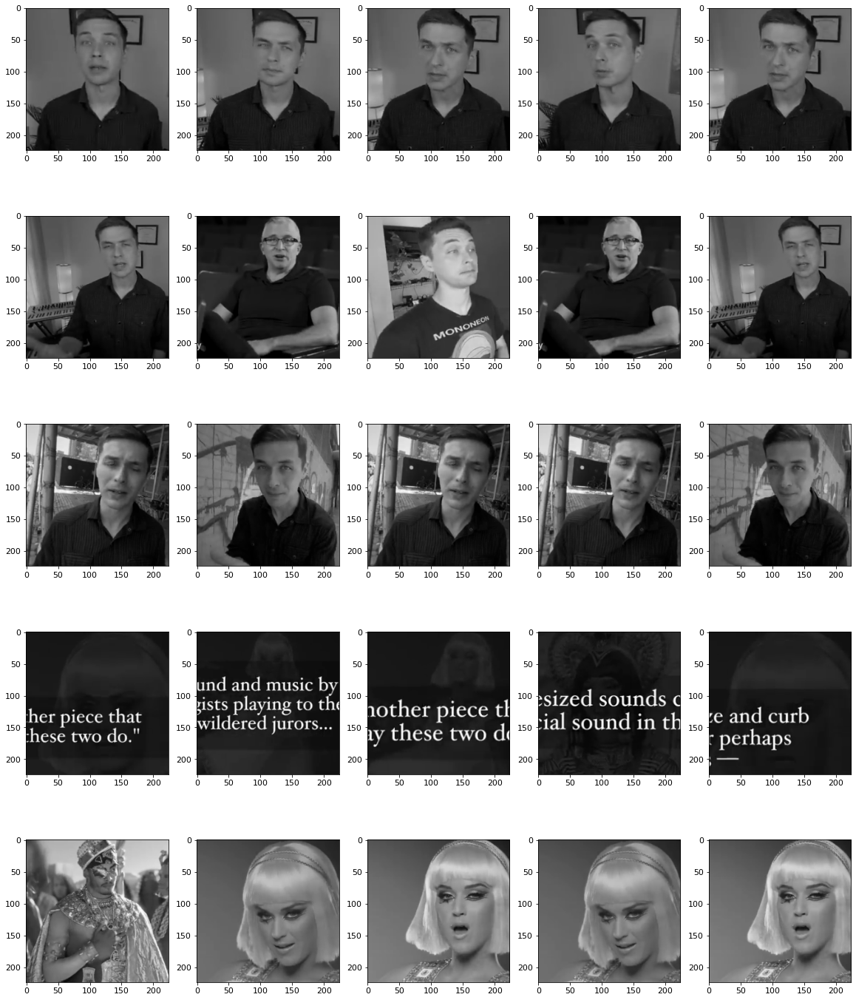

In [19]:
fig,ax=plt.subplots(cluster,5,figsize=(20,25))

for i in range(cluster):
    for j in range(5):
        idx=0
        while True:
            idx=random.randint(0,len(faces)-1)
            if (res[idx]==i):
                break

        ax[i,j].imshow(faces[idx])

In [20]:
bad=[1,1,1,0,0]

In [21]:
res

array([0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1, 4, 4, 3, 3, 4, 3, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 3, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 3, 3, 0, 1, 0, 2, 2, 0, 4], dtype=int32)

In [22]:
fin=[]

idx=0
for i in range(1,len(times)):
    isBad=0
    height,width=(frames[times[i]-1].shape[0],frames[times[i]-1].shape[1])
    mn,mx=0,width
    for obj in yolo_out[times[i]-1].xyxy[0]:
        if (obj[-1]==0):
            (x1,y1,x2,y2)=[int(obj[i]) for i in range(4)]
            if (ratio(frames[times[i]-1].shape,x1,y1,x2,y2)<=1/4): continue
            
            isBad|=bad[res[idx]]
            if (bad[res[idx]]):
                mn=max(mn,x2)
                mx=min(mx,x1)
            idx+=1
    
    time=(times[i-1]+times[i])//2
    if (isBad):
        if (mn<width/2):
            fin.append((time,frames[times[i]-1][0:height,mn:width]))
        elif (width/2<mx):
            fin.append((time,frames[times[i]-1][0:height,0:mx]))

    else:
        fin.append((time,frames[times[i]-1]))

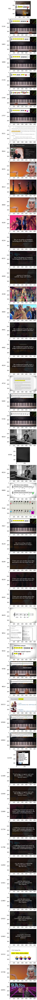

In [23]:
fig,axs=plt.subplots(len(fin),figsize=(8,len(fin)*3))

for i in range(len(fin)):
    axs[i].imshow(fin[i][1])

pad=5
for ax, row in zip(axs, fin):
    ax.annotate(row[0], xy=(0, 0.5), xytext=(-ax.yaxis.labelpad - pad, 0),
            xycoords=ax.yaxis.label, textcoords='offset points',
            size='large', ha='right', va='center')